# Bus Ridership Amidst Covid-19

By Shaun Khoo (5th Sept 2020). See write-up on [my website](https://shaunkhoo.github.io/post/20200904_covid19publictransportanalysis/).

In [294]:
import pandas as pd
import geopandas
import folium
import requests
import seaborn as sns
import matplotlib.pyplot as plt

### A) Processing SG Bus Stops Data

First we call LTA's DataMall API endpoint for bus stops to obtain location data for all bus stops in Singapore.

In [162]:
lta_api_key = "Your_API_Key"

def call_bus_stops_data(api_key):
    
    # Define the bus stops endpoint - change it here if the URL updates
    bus_stops_endpoint = "http://datamall2.mytransport.sg/ltaodataservice/BusStops"
    
    # Initialising variables for the while loop
    cont = True
    skip = 0
    bus_stops_list = []

    # Using a while loop to continuously query the API until there are none left
    while cont:
        response = requests.get(bus_stops_endpoint, 
                                headers = {'AccountKey': api_key},
                                params = {'$skip': skip})
        bus_stops_list.extend(response.json()['value'])
        skip += 500
        print("Successfully called page {} of bus stops data...\r".format(int(skip/500)), end = ""),
        if len(response.json()['value']) < 500:
            cont = False
    print()
    print("Completed calling all bus stops data!")
    
    # Converting the data into a GeoPandas dataframe
    output = pd.DataFrame(bus_stops_list)
    output_gpd = geopandas.GeoDataFrame(output, geometry = geopandas.points_from_xy(output.Longitude, output.Latitude))
    output_gpd.crs =  'epsg:4326'
    
    # Returning a Pandas dataframe of all bus stops and the data    
    return output_gpd

bus_stops = call_bus_stops_data(lta_api_key)

Successfully called page 11 of bus stops data...
Completed calling all bus stops data!


In [163]:
bus_stops

,BusStopCode,RoadName,Description,Latitude,Longitude,geometry
0,01012,Victoria St,Hotel Grand Pacific,1.296848,103.852536,POINT (103.85254 1.29685)
1,01013,Victoria St,St. Joseph's Ch,1.297710,103.853225,POINT (103.85322 1.29771)
2,01019,Victoria St,Bras Basah Cplx,1.296990,103.853022,POINT (103.85302 1.29699)
3,01029,Nth Bridge Rd,Opp Natl Lib,1.296673,103.854414,POINT (103.85441 1.29667)
4,01039,Nth Bridge Rd,Bugis Cube,1.298208,103.855491,POINT (103.85549 1.29821)
...,...,...,...,...,...,...
5038,99139,Changi Village Rd,Blk 5,1.388195,103.987234,POINT (103.98723 1.38819)
5039,99161,Nicoll Dr,Bef Changi Beach CP 3,1.390262,103.992957,POINT (103.99296 1.39026)
5040,99171,Nicoll Dr,Changi Beach CP 2,1.391128,103.991021,POINT (103.99102 1.39113)
5041,99181,Telok Paku Rd,Bef S'pore Aviation Ac,1.387754,103.988503,POINT (103.98850 1.38775)


In [164]:
bus_stops.to_file("bus_stops.geojson", driver = 'GeoJSON')

### B) Processing URA Master Plan 2019 Data

First we import URA's Master Plan 2019 GeoJSON file as a GeoPandas object into our Python environment.

In [86]:
mp19 = geopandas.read_file('Data/URA_MP19_LANDUSEPL.geojson')

In [52]:
mp19.shape

(113212, 20)

In [51]:
mp19.head()

,Name,description,timestamp,begin,end,altitudeMode,tessellate,extrude,visibility,drawOrder,icon,snippet,LU_DESC,LU_TEXT,GPR,WHI_Q_MX,GPR_B_MN,INC_CRC,FMEL_UPD_D,geometry
0,kml_1,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,None,,OPEN SPACE,,EVA,None,None,2481817E4931D054,20191209171707,"POLYGON Z ((103.81658 1.33889 0.00000, 103.816..."
1,kml_2,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,None,,ROAD,None,NA,None,None,C56C3E0EA19D36D8,20191209171707,"POLYGON Z ((103.83533 1.34171 0.00000, 103.835..."
2,kml_3,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,None,,PLACE OF WORSHIP,W,EVA,None,None,4EB80310CE2C1B60,20191209171707,"POLYGON Z ((103.73497 1.37614 0.00000, 103.734..."
3,kml_4,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,None,,ROAD,None,NA,None,None,544B09AB3A799753,20191209171707,"POLYGON Z ((103.86667 1.40520 0.00000, 103.866..."
4,kml_5,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,None,,COMMERCIAL,None,EVA,None,None,BB3AF1EBDFBB5AD9,20191209171707,"POLYGON Z ((103.86855 1.40995 0.00000, 103.868..."


We take a subset of the data to plot on Folium to get an understanding of the data.

In [730]:
SG_lat = 1.364697
SG_lon = 103.820678

subset = mp19.loc[[i for i in range(5000)]]
m = folium.Map(location = [SG_lat, SG_lon])
folium.GeoJson(
    subset,
    tooltip = folium.features.GeoJsonTooltip(fields=['LU_DESC']),
    name='Subsets'
).add_to(m)

m

In [56]:
mp19['LU_DESC'].value_counts()

RESIDENTIAL                                  79121
ROAD                                          6623
COMMERCIAL                                    5983
BUSINESS 2                                    5976
RESIDENTIAL WITH COMMERCIAL AT 1ST STOREY     2821
BUSINESS 1                                    1505
PARK                                          1425
UTILITY                                       1067
WATERBODY                                     1015
RESIDENTIAL / INSTITUTION                      960
COMMERCIAL & RESIDENTIAL                       905
OPEN SPACE                                     762
RESERVE SITE                                   665
PLACE OF WORSHIP                               645
CIVIC & COMMUNITY INSTITUTION                  629
EDUCATIONAL INSTITUTION                        608
COMMERCIAL / INSTITUTION                       533
TRANSPORT FACILITIES                           349
HOTEL                                          285
SPORTS & RECREATION            

There are too many categories here for our use case. We can remove some of them (like roads and water bodies), and reduce the rest into broader categories. For example, we may want to group all the residential categories together. Moreover, instead of keeping it as distinct groups, we can one-hot encode the categories to better represent hybrid developments.

In [117]:
def categorise(plots_LU):
    
    categories = {
        'RESIDENTIAL': ['RESIDENTIAL', 'WHITE'],
        'COMMERCIAL': ['COMMERCIAL', 'WHITE'],
        'BUSINESS': ['BUSINESS', 'AGRICULTURE', 'WHITE'],
        'EDUCATION': ['EDUCATIONAL'],
        'SPORTS & RECREATION': ['SPORTS & RECREATION', 'BEACH AREA'],
        'RELIGION': ['PLACE OF WORSHIP'],
        'CIVIC & COMMUNITY': ['CIVIC & COMMUNITY'],
        'HEALTH': ['HEALTH & MEDICAL CARE'],
        'TOURISM': ['HOTEL', 'PORT / AIRPORT']
    }
    
    final = []
    for plot_LU in plots_LU:
        output = {}
        for category in categories.keys():
            if category in plot_LU:
                output[category] = 1
            elif plot_LU in categories[category]:
                output[category] = 1
        final.append(output)
    
    return pd.DataFrame(final).fillna(0)

categorise(mp19['LU_DESC']).sum(axis = 0).sort_values()

HEALTH                   195.0
SPORTS & RECREATION      276.0
TOURISM                  334.0
EDUCATION                608.0
CIVIC & COMMUNITY        629.0
RELIGION                 645.0
BUSINESS                8154.0
COMMERCIAL             10405.0
RESIDENTIAL            83970.0
dtype: float64

Now that we have reduced it to 9 categories, we can append it to the GeoPandas dataset so that each polygon is associated with some of these categories. Note that there are some plots that have no category at all - those will be considered as equivalent to 'Others' in this analysis.

In [118]:
mp19_cat = pd.concat([mp19, categorise(mp19['LU_DESC'])], axis = 1)

In [119]:
mp19_cat.head()

,Name,description,timestamp,begin,end,altitudeMode,tessellate,extrude,visibility,drawOrder,...,geometry,RELIGION,COMMERCIAL,BUSINESS,SPORTS & RECREATION,RESIDENTIAL,CIVIC & COMMUNITY,EDUCATION,HEALTH,TOURISM
0,kml_1,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,...,"POLYGON Z ((103.81658 1.33889 0.00000, 103.816...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,kml_2,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,...,"POLYGON Z ((103.83533 1.34171 0.00000, 103.835...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,kml_3,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,...,"POLYGON Z ((103.73497 1.37614 0.00000, 103.734...",1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,kml_4,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,...,"POLYGON Z ((103.86667 1.40520 0.00000, 103.866...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,kml_5,<center><table><tr><th colspan='2' align='cent...,None,None,None,None,-1,0,-1,None,...,"POLYGON Z ((103.86855 1.40995 0.00000, 103.868...",0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [144]:
mp19_cat.to_file("URA_MP2019_Categorised.geojson", driver = 'GeoJSON')

The objective here is to use URA's Master Plan data to identify what kind of areas each bus stop is located in. However, bus stops are typically located along roads, and people tend to walk at least a short distance to their destination from the bus stop. In order to better represent this, we should add a buffer around each of the current polygons (representing the land plot and its use) and do a spatial join with our bus stops data.

In [120]:
mp19_cat.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The current GeoPandas dataset uses a geographic CRS, but we need to use a projected CRS in order to add a uniform buffer around each of the polygons. As such, we reproject the data to the EPSG 3857 projection, and add 100 metres of buffer around each polygon.

In [121]:
mp19_cat_reproj = mp19_cat.to_crs(3857)
mp19_cat_reproj['geometry'] = mp19_cat_reproj.geometry.buffer(100)

In [177]:
subset = mp19_cat_reproj[mp19_cat_reproj['SPORTS & RECREATION'] == 1]
m = folium.Map(location = [SG_lat, SG_lon])
folium.GeoJson(
    subset,
    tooltip = folium.features.GeoJsonTooltip(fields=['LU_DESC']),
    name='Subsets'
).add_to(m)
m

Now we reproject it back to the original CRS.

In [205]:
mp19_cat_buffered = mp19_cat_reproj.to_crs(4326)
mp19_cat_buffered.to_file("URA_MP2019_Categorised.geojson", driver = 'GeoJSON')

We import the URA Master Plan 2019's Planning Area data so we can identify which neighbourhoods the bus stops are located in.

In [206]:
pa19 = geopandas.read_file('Data/URA_MP19_PLANNINGAREA.geojson')

In [208]:
pa19_final = pa19[['PLN_AREA_N', 'geometry']]

In [209]:
pa19_final.head()

,PLN_AREA_N,geometry
0,BUKIT MERAH,"POLYGON Z ((103.81740 1.29433 0.00000, 103.817..."
1,BUKIT PANJANG,"POLYGON Z ((103.77445 1.39029 0.00000, 103.774..."
2,BUKIT TIMAH,"POLYGON Z ((103.79766 1.34813 0.00000, 103.798..."
3,CENTRAL WATER CATCHMENT,"POLYGON Z ((103.80578 1.41436 0.00000, 103.805..."
4,CHANGI,"POLYGON Z ((103.98693 1.39794 0.00000, 103.987..."


### C) Putting the two together

Now that all datasets have been processed appropriately, we can now combine them together to identify what areas each bus stop serves, and use that as a proxy for that level of activity.

In [216]:
cols_to_drop = ['Latitude', 'Longitude', 'index_right', 'tessellate', 'extrude', 'visibility']
bus_stops_interim1 = geopandas.sjoin(bus_stops, mp19_cat_buffered, how = "inner", op = 'intersects')
bus_stops_interim1.drop(cols_to_drop, axis = 1, inplace = True)
bus_stops_interim2 = geopandas.sjoin(bus_stops_interim1, pa19_final, how = "left", op = 'intersects')

In [219]:
bus_stops_augmented = bus_stops_interim2.groupby(['BusStopCode', 'PLN_AREA_N']).sum()
for col in bus_stops_augmented.columns:
    bus_stops_augmented[col] = [1 if num > 0 else 0 for num in bus_stops_augmented[col]]

In [220]:
bus_stops_final = bus_stops.merge(bus_stops_augmented.reset_index(), on = "BusStopCode")
bus_stops_final

,BusStopCode,RoadName,Description,Latitude,Longitude,geometry,PLN_AREA_N,RELIGION,COMMERCIAL,BUSINESS,SPORTS & RECREATION,RESIDENTIAL,CIVIC & COMMUNITY,EDUCATION,HEALTH,TOURISM,index_right
0,01012,Victoria St,Hotel Grand Pacific,1.296848,103.852536,POINT (103.85254 1.29685),ROCHOR,1,1,0,0,1,1,1,0,1,1
1,01013,Victoria St,St. Joseph's Ch,1.297710,103.853225,POINT (103.85322 1.29771),ROCHOR,1,1,0,0,1,1,0,0,1,1
2,01019,Victoria St,Bras Basah Cplx,1.296990,103.853022,POINT (103.85302 1.29699),DOWNTOWN CORE,1,1,0,0,1,1,1,0,1,1
3,01029,Nth Bridge Rd,Opp Natl Lib,1.296673,103.854414,POINT (103.85441 1.29667),DOWNTOWN CORE,0,1,0,0,1,1,0,0,1,1
4,01039,Nth Bridge Rd,Bugis Cube,1.298208,103.855491,POINT (103.85549 1.29821),DOWNTOWN CORE,0,1,0,0,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5034,99139,Changi Village Rd,Blk 5,1.388195,103.987234,POINT (103.98723 1.38819),CHANGI,0,1,0,0,1,0,0,0,0,1
5035,99161,Nicoll Dr,Bef Changi Beach CP 3,1.390262,103.992957,POINT (103.99296 1.39026),CHANGI,0,0,0,1,0,0,0,0,1,1
5036,99171,Nicoll Dr,Changi Beach CP 2,1.391128,103.991021,POINT (103.99102 1.39113),CHANGI,0,0,0,1,0,0,0,0,0,1
5037,99181,Telok Paku Rd,Bef S'pore Aviation Ac,1.387754,103.988503,POINT (103.98850 1.38775),CHANGI,0,1,0,0,1,0,0,0,0,1


In [221]:
bus_stops_final.to_file("Bus_Stops_Final.geojson", driver = 'GeoJSON')

### D) Analysing origin-destination bus trips data

First we import all the node bus trips data from January 2020 to July 2020 and concatenate it into a single Pandas dataframe. Note this takes up a lot of memory since the files are large.

In [277]:
csv_list = []
for i in range(1, 8):
    csv_list.append(pd.read_csv('Data/transport_node_bus_20200{}.csv'.format(i)))
node_bus_ridership = pd.concat(csv_list)

In [278]:
node_bus_ridership.head()

,YEAR_MONTH,DAY_TYPE,TIME_PER_HOUR,PT_TYPE,PT_CODE,TOTAL_TAP_IN_VOLUME,TOTAL_TAP_OUT_VOLUME
0,2020-01,WEEKENDS/HOLIDAY,6,BUS,67551,224,22
1,2020-01,WEEKDAY,6,BUS,67551,3922,122
2,2020-01,WEEKDAY,7,BUS,66541,648,364
3,2020-01,WEEKENDS/HOLIDAY,7,BUS,66541,127,109
4,2020-01,WEEKENDS/HOLIDAY,17,BUS,54209,736,325


Here we set some design options for the chart using `RcParams` from `matplotlib`.

In [796]:
plt.rcParams.update(plt.rcParamsDefault)
plt.style.use('shaunkhoo.mplstyle')

#### Q1: What is the overall pattern of trips across January 2020 to July 2020?

We sum the tap-in ridership across all bus stops by each year-month combination. Since you have to tap in for all bus trips (or the vast majority do!), this should reflect total ridership across the entire public bus transportation network.

In [333]:
q1_data = node_bus_ridership.groupby(['YEAR_MONTH']).sum().reset_index()

In [334]:
q1_data['TOTAL_TAP_IN_VOLUME'] = round(q1_data['TOTAL_TAP_IN_VOLUME']/1000000, 2)
q1_data['TOTAL_TAP_OUT_VOLUME'] = round(q1_data['TOTAL_TAP_OUT_VOLUME']/1000000, 2)
q1_data

,YEAR_MONTH,TIME_PER_HOUR,PT_CODE,TOTAL_TAP_IN_VOLUME,TOTAL_TAP_OUT_VOLUME
0,2020-01,2604222,9594881812,116.16,116.17
1,2020-02,2597815,9548735554,101.46,101.47
2,2020-03,2600460,9539716288,98.72,98.74
3,2020-04,2563384,9339911087,41.33,41.33
4,2020-05,2528764,9212514475,34.38,34.39
5,2020-06,2546974,9304953213,59.16,59.17
6,2020-07,2567319,9394120500,78.21,78.22


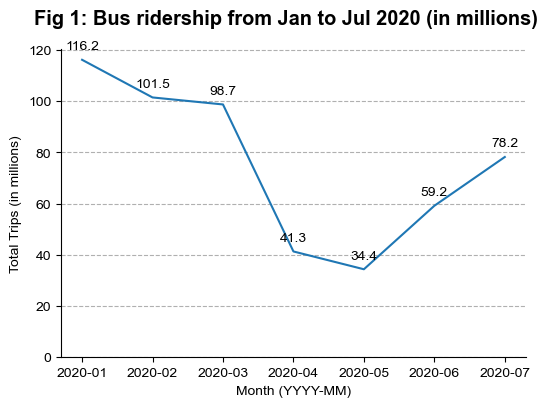

In [644]:
fig, ax = plt.subplots()

fig.suptitle("Fig 1: Bus ridership from Jan to Jul 2020 (in millions)",
             x = .5,
             ha = 'center')

q1_plot = sns.lineplot(x = 'YEAR_MONTH',
                       y = 'TOTAL_TAP_IN_VOLUME',
                       ax = ax,
                       data = q1_data)

for idx, row in q1_data.iterrows():
    ax.text(x = row['YEAR_MONTH'], 
            y = row['TOTAL_TAP_IN_VOLUME'] + 4,
            s = round(row['TOTAL_TAP_IN_VOLUME'], 1),
            ha = 'center')

q1_plot.set(ylim = (0, None),
            xlabel = "Month (YYYY-MM)",
            ylabel = "Total Trips (in millions)")

plt.savefig('Q1_Plot.png', dpi = 500)
plt.show()

#### Q2: In which neighbourhoods is this pattern strongest?

First we join the node bus ridership dataset with our bus stops dataset so we can break down the ridership numbers by the planning area that the bus stop is located in.

In [458]:
bus_stops_final['BusStopCode'] = bus_stops_final['BusStopCode'].astype('int64')
node_bus_ridership_augmented = node_bus_ridership.merge(bus_stops_final, 
                                                        how = "left",
                                                        left_on = "PT_CODE",
                                                        right_on = "BusStopCode")

In [462]:
node_bus_ridership_augmented.head()

,YEAR_MONTH,DAY_TYPE,TIME_PER_HOUR,PT_TYPE,PT_CODE,TOTAL_TAP_IN_VOLUME,TOTAL_TAP_OUT_VOLUME,BusStopCode,RoadName,Description,...,RELIGION,COMMERCIAL,BUSINESS,SPORTS & RECREATION,RESIDENTIAL,CIVIC & COMMUNITY,EDUCATION,HEALTH,TOURISM,index_right
0,2020-01,WEEKENDS/HOLIDAY,6,BUS,67551,224,22,67551.0,Sengkang West Way,Blk 471A,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
1,2020-01,WEEKDAY,6,BUS,67551,3922,122,67551.0,Sengkang West Way,Blk 471A,...,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
2,2020-01,WEEKDAY,7,BUS,66541,648,364,66541.0,Buangkok Link,Blk 980C,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0
3,2020-01,WEEKENDS/HOLIDAY,7,BUS,66541,127,109,66541.0,Buangkok Link,Blk 980C,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0
4,2020-01,WEEKENDS/HOLIDAY,17,BUS,54209,736,325,54209.0,Ang Mo Kio Ave 4,BET BLKS 152/155,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


Now we can aggregate the data to find what we need. We also normalise the values to January 2020 so that we can better understand the relative changes across each neighbourhood without being affected by the absolute numbers.

In [544]:
q2_data = node_bus_ridership_augmented.groupby(['YEAR_MONTH', 'PLN_AREA_N']).sum().reset_index()
q2_data['TOTAL_VOLUME'] = q2_data['TOTAL_TAP_IN_VOLUME'] + q2_data['TOTAL_TAP_OUT_VOLUME']

In [545]:
Jan2020_Volume = q2_data[q2_data['YEAR_MONTH'] == '2020-01'][['PLN_AREA_N', 'TOTAL_VOLUME']]
Adjusted_Volume = []
for idx, row in q2_data.iterrows():
    Adjusted_Volume.append(round(row['TOTAL_VOLUME']/Jan2020_Volume[Jan2020_Volume['PLN_AREA_N'] == row['PLN_AREA_N']]['TOTAL_VOLUME'].values[0] * 100, 2))
q2_data['NORMALISED_VOLUME'] = pd.Series(Adjusted_Volume)


In [546]:
q2_data

,YEAR_MONTH,PLN_AREA_N,TIME_PER_HOUR,PT_CODE,TOTAL_TAP_IN_VOLUME,TOTAL_TAP_OUT_VOLUME,BusStopCode,Latitude,Longitude,RELIGION,...,BUSINESS,SPORTS & RECREATION,RESIDENTIAL,CIVIC & COMMUNITY,EDUCATION,HEALTH,TOURISM,index_right,TOTAL_VOLUME,NORMALISED_VOLUME
0,2020-01,ANG MO KIO,86921,368032873,5225124,5130717,368032873.0,9232.299480,6.964783e+05,463.0,...,927.0,207.0,5792.0,541.0,1551.0,617.0,0.0,6707.0,10355841,100.00
1,2020-01,BEDOK,147241,946659639,7463150,7619898,946659639.0,14769.723435,1.159504e+06,1615.0,...,1745.0,145.0,10239.0,1229.0,2150.0,882.0,40.0,11157.0,15083048,100.00
2,2020-01,BISHAN,51186,211481042,2488337,2541572,211481042.0,5377.849941,4.122520e+05,612.0,...,680.0,365.0,3563.0,642.0,1317.0,162.0,0.0,3970.0,5029909,100.00
3,2020-01,BOON LAY,34477,53827937,162878,204167,53827937.0,3214.326729,2.531414e+05,36.0,...,2441.0,38.0,74.0,38.0,0.0,0.0,0.0,2441.0,367045,100.00
4,2020-01,BUKIT BATOK,83512,277293943,3467494,3359800,277293943.0,8700.675902,6.666109e+05,1103.0,...,402.0,462.0,5924.0,727.0,1719.0,376.0,0.0,6425.0,6827294,100.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,2020-07,TOA PAYOH,65779,279342281,2764781,2762556,279342281.0,6627.356721,5.150300e+05,602.0,...,1248.0,240.0,4756.0,1274.0,953.0,356.0,80.0,4959.0,5527337,71.51
346,2020-07,TUAS,81149,148224124,214402,224900,148224124.0,7628.242051,5.998765e+05,0.0,...,5554.0,149.0,0.0,71.0,0.0,0.0,0.0,5788.0,439302,45.73
347,2020-07,WESTERN WATER CATCHMENT,37217,80666723,162019,162726,80666723.0,3683.266477,2.792592e+05,0.0,...,433.0,0.0,156.0,419.0,783.0,0.0,0.0,2693.0,324745,33.30
348,2020-07,WOODLANDS,105695,379277519,4251410,4301572,379277519.0,11663.699009,8.413104e+05,706.0,...,1892.0,203.0,7313.0,660.0,1941.0,277.0,0.0,8106.0,8552982,59.19


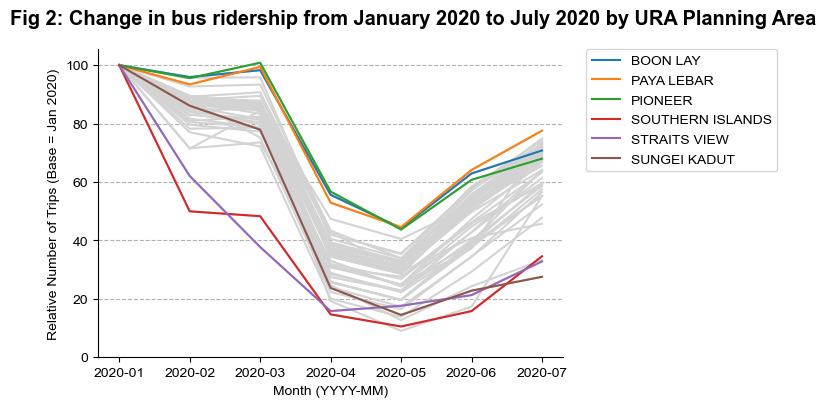

In [717]:
top3 = ['BOON LAY', 'PIONEER', 'PAYA LEBAR']
bot3 = ['STRAITS VIEW', 'SOUTHERN ISLANDS', 'SUNGEI KADUT']

fig, ax = plt.subplots()

fig.suptitle("Fig 2: Change in bus ridership from January 2020 to July 2020 by URA Planning Area",
             x = .65,
             ha = 'center')

q2_plot = sns.lineplot(x = 'YEAR_MONTH',
                       y = 'NORMALISED_VOLUME',
                       units = "PLN_AREA_N",
                       estimator = None,
                       color = 'lightgrey',
                       ax = ax,
                       data = q2_data)

q2_plot_overlay = sns.lineplot(x = 'YEAR_MONTH',
                               y = 'NORMALISED_VOLUME',
                               hue = "PLN_AREA_N",
                               ax = ax,
                               data = q2_data[q2_data['PLN_AREA_N'].isin(top3 + bot3)])

# We do this to remove the PLN_AREA_N that appears in the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles = handles[1:], 
          labels = labels[1:],
          bbox_to_anchor=(1.05, 1),
          loc = 'upper left', 
          borderaxespad = 0.)

q2_plot.set(ylim = (0, None),
            xlabel = "Month (YYYY-MM)",
            ylabel = "Relative Number of Trips (Base = Jan 2020)")

plt.savefig('Q2_Plot.png', dpi = 500, bbox_inches = 'tight')
plt.show()

Next, we generate the Leaflet maps which display each planning area and the bus stops located within the planning area.

In [719]:
for selected_pa in top3 + bot3:
    
    # Create the base map centered on the centroid of all bus stops
    m = folium.Map(zoom_start = 13,
                   location = [bus_stops_final['geometry'][bus_stops_final['PLN_AREA_N'] == selected_pa].unary_union.centroid.y, 
                               bus_stops_final['geometry'][bus_stops_final['PLN_AREA_N'] == selected_pa].unary_union.centroid.x])
    
    # Adding the satellite layer
    folium.TileLayer(
            tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
            attr = 'Esri',
            name = 'Esri Satellite',
            overlay = False,
            control = True
           ).add_to(m)
    
    # Adding the Planning Area
    folium.GeoJson(
        pa19_final[pa19_final['PLN_AREA_N'] == selected_pa],
        tooltip = folium.features.GeoJsonTooltip(fields=['PLN_AREA_N']),
        name = 'Neighbourhoods'
    ).add_to(m)
    
    # Adding the Bus Stops
    folium.GeoJson(
        bus_stops_final[bus_stops_final['PLN_AREA_N'] == selected_pa],
        tooltip = folium.features.GeoJsonTooltip(fields=['BusStopCode', 'RoadName', 'Description', 'Latitude', 'Longitude']),
        name = 'Bus Stops'
    ).add_to(m)
    
    # Exporting it for embedding on the website
    m.save('Q2_{}.html'.format(selected_pa.replace(' ', '_')))

We generate the dataset and map that shows May's relative ridership numbers by Planning Area for an overall view.

In [723]:
pa19_geo = pa19_final.merge(q2_data[q2_data['YEAR_MONTH'] == '2020-05'][['PLN_AREA_N', 'NORMALISED_VOLUME']])

In [725]:
pa19_geo.head()

,PLN_AREA_N,geometry,NORMALISED_VOLUME
0,BUKIT MERAH,"POLYGON Z ((103.81740 1.29433 0.00000, 103.817...",32.52
1,BUKIT PANJANG,"POLYGON Z ((103.77445 1.39029 0.00000, 103.774...",28.92
2,BUKIT TIMAH,"POLYGON Z ((103.79766 1.34813 0.00000, 103.798...",16.49
3,CENTRAL WATER CATCHMENT,"POLYGON Z ((103.80578 1.41436 0.00000, 103.805...",24.84
4,CHANGI,"POLYGON Z ((103.98693 1.39794 0.00000, 103.987...",40.50


In [786]:
m = folium.Map(location = [SG_lat, SG_lon],
               zoom_start = 11,
               tiles = 'CartoDB positron')
choropleth = folium.Choropleth(
    geo_data = pa19_geo,
    data = pa19_geo,
    columns = ['PLN_AREA_N', 'NORMALISED_VOLUME'],
    key_on = 'feature.properties.PLN_AREA_N',
    name = 'PlanningAreaChloropleth',
    legend_name = 'Normalised Volume (base = Jan 2020)',
    tooltip = folium.features.GeoJsonTooltip(fields = ['PLN_AREA_N', 'NORMALISED_VOLUME']),
    bins = [0, 10, 20, 30, 40, 50]
).add_to(m)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['PLN_AREA_N', 'NORMALISED_VOLUME'])
)
m.save('Q2_Choropleth.html')
m

#### Q3: For which timings is this pattern strongest?

To investigate this, we aggregate the `node_bus_ridership_augmented` dataset by month, day type, and hour.

In [802]:
q3a_data = node_bus_ridership_augmented.groupby(['YEAR_MONTH', 'DAY_TYPE', 'TIME_PER_HOUR']).sum()['TOTAL_TAP_IN_VOLUME'].reset_index()

In [803]:
q3a_data

,YEAR_MONTH,DAY_TYPE,TIME_PER_HOUR,TOTAL_TAP_IN_VOLUME
0,2020-01,WEEKDAY,0,315598
1,2020-01,WEEKDAY,1,17682
2,2020-01,WEEKDAY,2,1351
3,2020-01,WEEKDAY,3,289
4,2020-01,WEEKDAY,4,395
...,...,...,...,...
330,2020-07,WEEKENDS/HOLIDAY,19,1214577
331,2020-07,WEEKENDS/HOLIDAY,20,1064038
332,2020-07,WEEKENDS/HOLIDAY,21,912979
333,2020-07,WEEKENDS/HOLIDAY,22,740800


Again we normalise it with reference to January 2020's ridership numbers.

In [815]:
Jan2020_VolumeByTiming = Q3a_data[Q3a_data['YEAR_MONTH'] == '2020-01']
Adjusted_VolumeByTiming = []
for idx, row in Q3a_data.iterrows():
    Adjusted_VolumeByTiming.append(round(row['TOTAL_TAP_IN_VOLUME']/Jan2020_VolumeByTiming[(Jan2020_VolumeByTiming['DAY_TYPE'] == row['DAY_TYPE']) & (Jan2020_VolumeByTiming['TIME_PER_HOUR'] == row['TIME_PER_HOUR'])]['TOTAL_TAP_IN_VOLUME'].values[0] * 100, 2))
q3a_data['NORMALISED_VOLUME'] = pd.Series(Adjusted_VolumeByTiming)
q3a_data['TIME_PER_HOUR'] = [24 if i == 0 else int(i) for i in q3a_data['TIME_PER_HOUR']]
q3a_data_final = q3a_data[q3a_data['TIME_PER_HOUR'] >= 5]

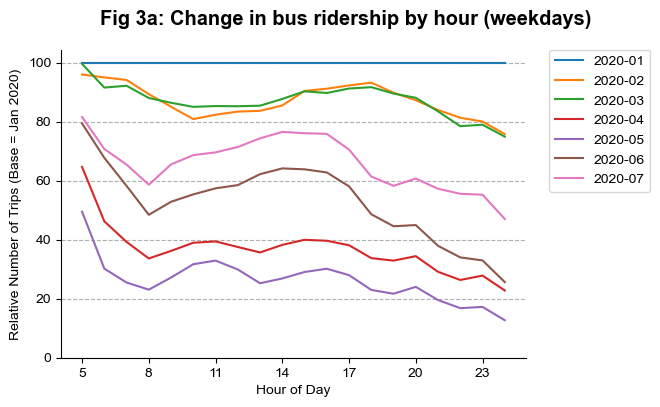

In [846]:
fig, ax = plt.subplots()
ax.set_xticks([5, 8, 11, 14, 17, 20, 23])

fig.suptitle("Fig 3a: Change in bus ridership by hour (weekdays)",
             x = .60,
             ha = 'center')

q3a_plot = sns.lineplot(x = 'TIME_PER_HOUR',
                        y = 'NORMALISED_VOLUME',
                        hue = "YEAR_MONTH",
                        ci = None,
                        ax = ax,
                        data = q3a_data_final[q3a_data_final['DAY_TYPE'] == 'WEEKDAY'])

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles = handles[1:], 
          labels = labels[1:],
          bbox_to_anchor=(1.05, 1),
          loc = 'upper left', 
          borderaxespad = 0.)

q3a_plot.set(ylim = (0, None),
             xlabel = "Hour of Day",
             ylabel = "Relative Number of Trips (Base = Jan 2020)")

plt.savefig('Q3a_Plot.png', dpi = 500, bbox_inches = 'tight')
plt.show()

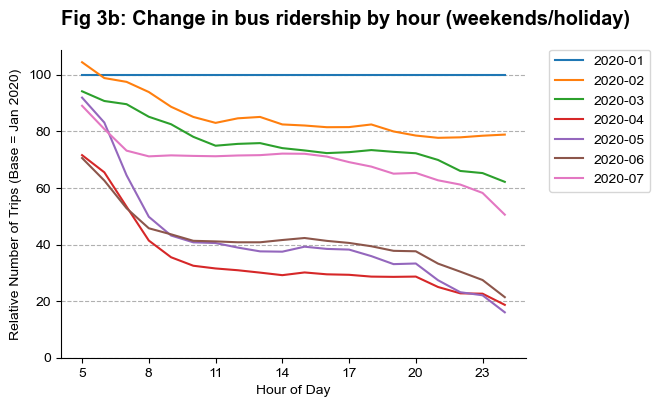

In [847]:
fig, ax = plt.subplots()
ax.set_xticks([5, 8, 11, 14, 17, 20, 23])

fig.suptitle("Fig 3b: Change in bus ridership by hour (weekends/holiday)",
             x = .60,
             ha = 'center')

q3b_plot = sns.lineplot(x = 'TIME_PER_HOUR',
                        y = 'NORMALISED_VOLUME',
                        hue = "YEAR_MONTH",
                        ci = None,
                        ax = ax,
                        data = q3a_data_final[q3a_data_final['DAY_TYPE'] == 'WEEKENDS/HOLIDAY'])

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles = handles[1:], 
          labels = labels[1:],
          bbox_to_anchor=(1.05, 1),
          loc = 'upper left', 
          borderaxespad = 0.)

q3b_plot.set(ylim = (0, None),
             xlabel = "Hour of Day",
             ylabel = "Relative Number of Trips (Base = Jan 2020)")

plt.savefig('Q3b_Plot.png', dpi = 500, bbox_inches = 'tight')
plt.show()

#### 4. Are there any differences for bus stops located in different areas?

This was left unpublished because the results weren't interesting, but this aggregates bus ridership by the the land use categories that the bus stop is close to.

In [850]:
node_bus_ridership_augmented.groupby(['YEAR_MONTH', 'PT_CODE']).sum()

TIME_PER_HOUR  TOTAL_TAP_IN_VOLUME  TOTAL_TAP_OUT_VOLUME  \
YEAR_MONTH PT_CODE                                                             
2020-01    1012               532                35842                 42043   
           1013               522                24545                 14435   
           1019               527                18858                 28741   
           1029               532                37311                 24811   
           1039               532                64089                 59856   
...                           ...                  ...                   ...   
2020-07    99139              534                   29                 20773   
           99161              522                  106                   678   
           99171              527                  407                  2899   
           99181              532                11539                 12264   
           99189              523                 3037                  8318   

                    BusStopCode   Latitude    Longitude  RELIGION  COMMERCIAL  \
YEAR_MONTH PT_CODE                                                              
2020-01    1012         40480.0  51.873930  4154.101437      40.0        40.0   
           1013         38494.0  49.312969  3946.422540      38.0        38.0   
           1019         39741.0  50.582591  4050.267858      39.0        39.0   
           1029         41160.0  51.866919  4154.176569       0.0        40.0   
           1039         41560.0  51.928314  4154.219656       0.0        40.0   
...                         ...        ...          ...       ...         ...   
2020-07    99139      4163838.0  58.304188  4367.463821       0.0        42.0   
           99161      3569796.0  50.049425  3743.746439       0.0         0.0   
           99171      3669327.0  51.471718  3847.667791       0.0         0.0   
           99181      3967240.0  55.510165  4159.540124       0.0        40.0   
           99189      3868371.0  54.148153  4055.598939       0.0        39.0   

                    BUSINESS  SPORTS & RECREATION  RESIDENTIAL  \
YEAR_MONTH PT_CODE                                               
2020-01    1012          0.0                  0.0         40.0   
           1013          0.0                  0.0         38.0   
           1019          0.0                  0.0         39.0   
           1029          0.0                  0.0         40.0   
           1039          0.0                  0.0         40.0   
...                      ...                  ...          ...   
2020-07    99139         0.0                  0.0         42.0   
           99161         0.0                 36.0          0.0   
           99171         0.0                 37.0          0.0   
           99181         0.0                  0.0         40.0   
           99189         0.0                  0.0         39.0   

                    CIVIC & COMMUNITY  EDUCATION  HEALTH  TOURISM  index_right  
YEAR_MONTH PT_CODE                                                              
2020-01    1012                  40.0       40.0     0.0     40.0         40.0  
           1013                  38.0        0.0     0.0     38.0         38.0  
           1019                  39.0       39.0     0.0     39.0         39.0  
           1029                  40.0        0.0     0.0     40.0         40.0  
           1039                  40.0        0.0     0.0      0.0         40.0  
...                               ...        ...     ...      ...          ...  
2020-07    99139                  0.0        0.0     0.0      0.0         42.0  
           99161                  0.0        0.0     0.0     36.0         36.0  
           99171                  0.0        0.0     0.0      0.0         37.0  
           99181                  0.0        0.0     0.0      0.0         40.0  
           99189                  0.0       39.0     0.0      0.0         39.0  

[35148 rows 

In [869]:
categories = ['RESIDENTIAL', 'COMMERCIAL', 'BUSINESS', 'EDUCATION', 'SPORTS & RECREATION', 'CIVIC & COMMUNITY', 'HEALTH', 'TOURISM', 'RELIGION']
node_bus_ridership_augmented['TOTAL_VOLUME'] = node_bus_ridership_augmented['TOTAL_TAP_IN_VOLUME'] + node_bus_ridership_augmented['TOTAL_TAP_OUT_VOLUME']

q4_data_list = []

for category in categories[0:]:
    ridership_cat = node_bus_ridership_augmented[node_bus_ridership_augmented[category] > 0].groupby(['YEAR_MONTH']).sum()[['TOTAL_VOLUME']]
    ridership_cat['Category'] = category
    ridership_cat['NORMALISED_VOLUME'] = round(ridership_cat['TOTAL_VOLUME']/ridership_cat['TOTAL_VOLUME'][0] * 100, 2)
    q4_data_list.append(ridership_cat.reset_index())
    
q4_data = pd.concat(q4_data_list)

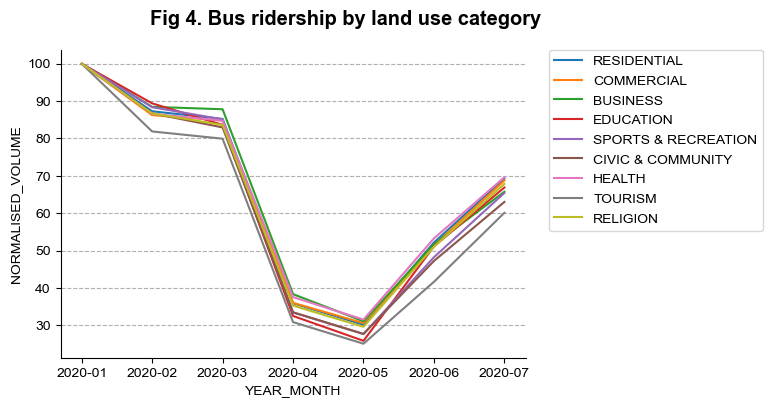

In [873]:
fig, ax = plt.subplots()

fig.suptitle("Fig 4. Bus ridership by land use category",
             x = .60,
             ha = 'center')

q4_plot = sns.lineplot(x = 'YEAR_MONTH',
                       y = 'NORMALISED_VOLUME',
                       hue = "Category",
                       ci = None,
                       ax = ax,
                       data = q4_data)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles = handles[1:], 
          labels = labels[1:],
          bbox_to_anchor=(1.05, 1),
          loc = 'upper left', 
          borderaxespad = 0.)

q3b_plot.set(ylim = (0, None),
             xlabel = "Hour of Day",
             ylabel = "Relative Number of Trips (Base = Jan 2020)")

plt.savefig('Q4_Plot.png', dpi = 500, bbox_inches = 'tight')
plt.show()